<Body>   
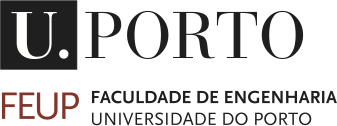   
<h1> <b>Advanced Topics on Intelligent Systems </b> </h1>
<p><b>Henrique Ribeiro</b> (202204383) | <b>Ian Karkles</b> (202200596) | <b>Vitor Pereira</b> (202210497)
<p>Master in Data Science and Engineering</p>
</Body>
Faculdade de Engenharia da Universidade do Porto

---

# Reinforcement Learning Trading Bot

In [1]:
!pip3 install gym-anytrading
!pip3 install stable_baselines3
!pip3 install quantstats

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.2/172.2 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.7/181.7 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 1.4 MB/s eta 0:00:00


In [2]:
# Gym
import gym_anytrading
import gymnasium as gym

# Stable baselines
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3 import A2C, PPO
from stable_baselines3.common.callbacks import BaseCallback
from gym_anytrading.envs import Actions
from gymnasium.wrappers import PassiveEnvChecker, OrderEnforcing

# Processing libraries
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import yfinance as yf

import torch
import random
import quantstats as qs
import copy

## 1. Load data

In [3]:
def import_data(tickers: str, start_date: str, end_date: str):
    df = yf.download(tickers=tickers, start=start_date, end=end_date)
    df = pd.DataFrame(df)

    return df


def data_fixing(df: pd.DataFrame):
    # Create data column from the index
    df['Date'] = df.index
    df = df.reset_index(drop=True)
    # Reorganize dataframe
    df = df[['Date','Open', 'High', 'Low', 'Close', 'Volume']] # Adj close was removed
    # Convert to datetime to use in the gym env
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    df.sort_index()
    return df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [4]:
apple = import_data('AAPL', '2019-01-01', '2022-12-31') # Apple data from 2019 until 2022
apple = data_fixing(apple)
apple

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Volume
Date,,,,,
2019-01-02,38.722500,39.712502,38.557499,39.480000,148158800
2019-01-03,35.994999,36.430000,35.500000,35.547501,365248800
2019-01-04,36.132500,37.137501,35.950001,37.064999,234428400
2019-01-07,37.174999,37.207500,36.474998,36.982498,219111200
2019-01-08,37.389999,37.955002,37.130001,37.687500,164101200
...,...,...,...,...,...
2022-12-23,130.919998,132.419998,129.639999,131.860001,63814900
2022-12-27,131.380005,131.410004,128.720001,130.029999,69007800
2022-12-28,129.669998,131.029999,125.870003,126.040001,85438400


## 2. Environment

In [ ]:
def print_stats(reward_over_episodes):
    """  Print Reward  """

    avg = np.mean(reward_over_episodes)
    min = np.min(reward_over_episodes)
    max = np.max(reward_over_episodes)

    print (f'Min. Reward          : {min:>10.3f}')
    print (f'Avg. Reward          : {avg:>10.3f}')
    print (f'Max. Reward          : {max:>10.3f}')

    return min, avg, max

In [ ]:
# STATS #
def get_results(profit_total, episodes_rewards, action_stats):
    print(f"Max profit: {np.max(profit_total):.3f}")
    print('-'* 60)
    print_stats(episodes_rewards)
    print('-'* 60)
    print('Actions distribution')
    print(f"Sell: {action_stats[Actions.Sell]} - Buy: {action_stats[Actions.Sell]}")

In [ ]:
# env_name = 'stocks-v0'
# env = gym.make(env_name, df=apple, frame_bound=(50, 100), window_size=10)
# print(env)

In [ ]:
window_size = 10
start_index = window_size
end_index = len(apple)

env = gym.make(
    'stocks-v0',
    df=apple,
    window_size=window_size,
    frame_bound=(start_index, end_index)
)


In [ ]:
def train_model(env, seed, model, model_name, timesteps):
    #obs = env.reset(seed=seed)
    torch.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)
    #obs = env.reset()
    vec_env = None
    print('-'*60)
    if model is not None:
        print(f'Model {type(model)}\n')
        print(f'Policy {type(model.policy)}')
        print('-'*60)
        model.learn(total_timesteps=timesteps)
        model.save(model_name)
        vec_env = model.get_env()
        obs = vec_env.reset()
    else:
        print ("\tRANDOM actions")

In [ ]:
def episode_iter(env, num_episodes, model):
    vec_env = None

    if model is not None:
        vec_env = model.get_env()
        obs = env.reset()

    #done = False
    episodes_rewards = []
    avg_episode_rewards = []
    profit_total = []
    total_data = []
    for episode in tqdm(range(num_episodes), desc='Episode progress'):
        done = False
        rewards = 0
        action_stats = {Actions.Sell: 0, Actions.Buy: 0}

        observation, info = env.reset(seed=2023)

        while not done:
            if model is not None:
                # action = env.action_space.sample()
                action, _states = model.predict(observation)
                action_stats[Actions(action)] += 1
                observation, reward, terminated, truncated, info = env.step(action)
                done = terminated or truncated
            else:
                action = env.action_space.sample()
                observation, reward, terminated, truncated, info = env.step(action)
                done = terminated or truncated
            #print(f'Reward: {reward}')
            rewards += reward
            # env.render()
            if done:
                total_data.append([episode,[copy.deepcopy(env), info]])
                # store all the rewards in each episode
                episodes_rewards.append(rewards)
                break

        if model is not None:
            profit_total.append(info['total_profit'])
        else:
            profit_total.append(info['total_profit'])

        # compute avg after each episode
        avg_rewards = np.mean(episodes_rewards)

        # store the avg rewards in each episode
        avg_episode_rewards.append(avg_rewards)

        print(f'Episode: {episode} - Average Rewards: {avg_rewards:.3f}')

    env.close()
    print('\nFinished!')
    print('-'*60)
    get_results(profit_total, episodes_rewards, action_stats)
    return episodes_rewards, avg_episode_rewards, total_data

## 3. Train model

### 3.1 Random actions

In [ ]:
train_model(env=env, seed=2023, model_name=None, model=None, timesteps=1000000)
#obs = env.reset()
rewards_array_random, avg_episode_rewards_random, _ = episode_iter(env, 1000, model=None)

------------------------------------------------------------
	RANDOM actions


Episode progress:   0%|          | 0/1000 [00:00<?, ?it/s]

Episode: 0 - Average Rewards: 26.437
Episode: 1 - Average Rewards: 26.437
Episode: 2 - Average Rewards: 26.437
Episode: 3 - Average Rewards: 26.437
Episode: 4 - Average Rewards: 26.437
Episode: 5 - Average Rewards: 26.437
Episode: 6 - Average Rewards: 26.437
Episode: 7 - Average Rewards: 26.437
Episode: 8 - Average Rewards: 26.437
Episode: 9 - Average Rewards: 26.437
Episode: 10 - Average Rewards: 26.437
Episode: 11 - Average Rewards: 26.437
Episode: 12 - Average Rewards: 26.437
Episode: 13 - Average Rewards: 26.437
Episode: 14 - Average Rewards: 26.437
Episode: 15 - Average Rewards: 26.437
Episode: 16 - Average Rewards: 26.437
Episode: 17 - Average Rewards: 26.437
Episode: 18 - Average Rewards: 26.437
Episode: 19 - Average Rewards: 26.437
Episode: 20 - Average Rewards: 26.437
Episode: 21 - Average Rewards: 26.437
Episode: 22 - Average Rewards: 26.437
Episode: 23 - Average Rewards: 26.437
Episode: 24 - Average Rewards: 26.437
Episode: 25 - Average Rewards: 26.437
Episode: 26 - Average 

### 3.2 A2C

In [ ]:
train_model(env=env, seed=2023, model_name='a2c_model_2.pk1', model=A2C('MlpPolicy', env, verbose=0), timesteps=1000000)
#obs = env.reset()
rewards_array_a2c, avg_episode_rewards_a2c, total_data_a2c = episode_iter(env, 100000, model=A2C.load('a2c_model_2.pk1', env=env, verbose=0))

------------------------------------------------------------
Model <class 'stable_baselines3.a2c.a2c.A2C'>

Policy <class 'stable_baselines3.common.policies.ActorCriticPolicy'>
------------------------------------------------------------


Episode progress:   0%|          | 0/100000 [00:00<?, ?it/s]

Episode: 0 - Average Rewards: 8.427
Episode: 1 - Average Rewards: 37.396
Episode: 2 - Average Rewards: 51.901
Episode: 3 - Average Rewards: 62.386
Episode: 4 - Average Rewards: 60.804
Episode: 5 - Average Rewards: 58.590
Episode: 6 - Average Rewards: 58.593
Episode: 7 - Average Rewards: 56.637
Episode: 8 - Average Rewards: 58.575
Episode: 9 - Average Rewards: 57.903
Episode: 10 - Average Rewards: 59.743
Episode: 11 - Average Rewards: 57.194
Episode: 12 - Average Rewards: 56.039
Episode: 13 - Average Rewards: 54.348
Episode: 14 - Average Rewards: 51.694
Episode: 15 - Average Rewards: 53.872
Episode: 16 - Average Rewards: 55.945
Episode: 17 - Average Rewards: 57.655
Episode: 18 - Average Rewards: 58.136
Episode: 19 - Average Rewards: 60.668
Episode: 20 - Average Rewards: 57.540
Episode: 21 - Average Rewards: 54.075
Episode: 22 - Average Rewards: 52.531
Episode: 23 - Average Rewards: 50.149
Episode: 24 - Average Rewards: 53.031
Episode: 25 - Average Rewards: 54.641
Episode: 26 - Average R

### 3.3 PPO

In [ ]:
train_model(env=env, seed=2023, model_name='ppo_model_2.pk1', model=PPO('MlpPolicy', env, verbose=0), timesteps=1000000)
#obs = env.reset()
rewards_array_ppo, avg_episode_rewards_ppo, total_data_ppo = episode_iter(env, 100000, model=PPO.load('ppo_model_2.pk1', env=env, verbose=0))

------------------------------------------------------------
Model <class 'stable_baselines3.ppo.ppo.PPO'>

Policy <class 'stable_baselines3.common.policies.ActorCriticPolicy'>
------------------------------------------------------------


Episode progress:   0%|          | 0/100000 [00:00<?, ?it/s]

Episode: 0 - Average Rewards: 52.450
Episode: 1 - Average Rewards: 54.343
Episode: 2 - Average Rewards: 68.213
Episode: 3 - Average Rewards: 87.212
Episode: 4 - Average Rewards: 85.717
Episode: 5 - Average Rewards: 85.986
Episode: 6 - Average Rewards: 83.046
Episode: 7 - Average Rewards: 81.001
Episode: 8 - Average Rewards: 78.204
Episode: 9 - Average Rewards: 76.601
Episode: 10 - Average Rewards: 81.615
Episode: 11 - Average Rewards: 82.481
Episode: 12 - Average Rewards: 82.978
Episode: 13 - Average Rewards: 83.742
Episode: 14 - Average Rewards: 84.414
Episode: 15 - Average Rewards: 86.340
Episode: 16 - Average Rewards: 86.291
Episode: 17 - Average Rewards: 87.430
Episode: 18 - Average Rewards: 90.031
Episode: 19 - Average Rewards: 88.076
Episode: 20 - Average Rewards: 87.269
Episode: 21 - Average Rewards: 86.258
Episode: 22 - Average Rewards: 88.505
Episode: 23 - Average Rewards: 89.079
Episode: 24 - Average Rewards: 87.626
Episode: 25 - Average Rewards: 87.424
Episode: 26 - Average 

## 4. Evaluation

In [ ]:
results = pd.DataFrame()
results_dict = {
    #'Random actions': [item for item in rewards_array_random],
    'A2C': [item for item in rewards_array_a2c],
    'PPO': [item for item in rewards_array_ppo]
}
results = pd.DataFrame(results_dict)


In [ ]:
window_size = 50000  # You can adjust the window size based on your preference

results['A2C_MA'] = results['A2C'].rolling(window=window_size).mean()

results['PPO_MA'] = results['PPO'].rolling(window=window_size).mean()

### 4.1 Rewards evolution

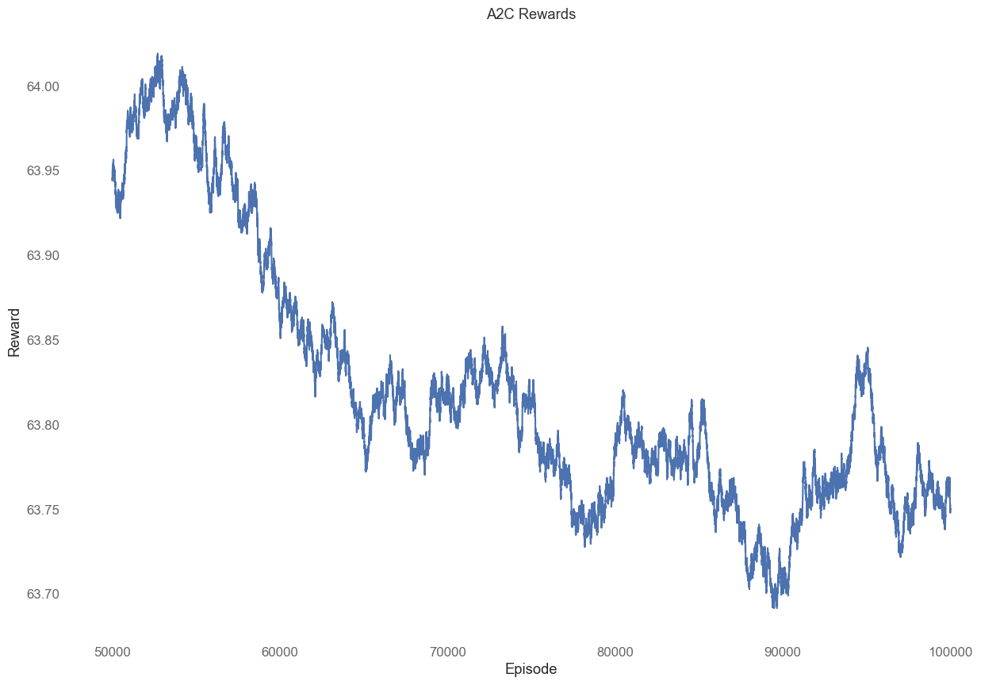

In [ ]:
plt.figure(figsize=(15, 10))
#plt.plot(results['Random actions'], label='Random Actions')
plt.plot(results['A2C_MA'])
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('A2C Rewards')
plt.grid(False)
plt.show()

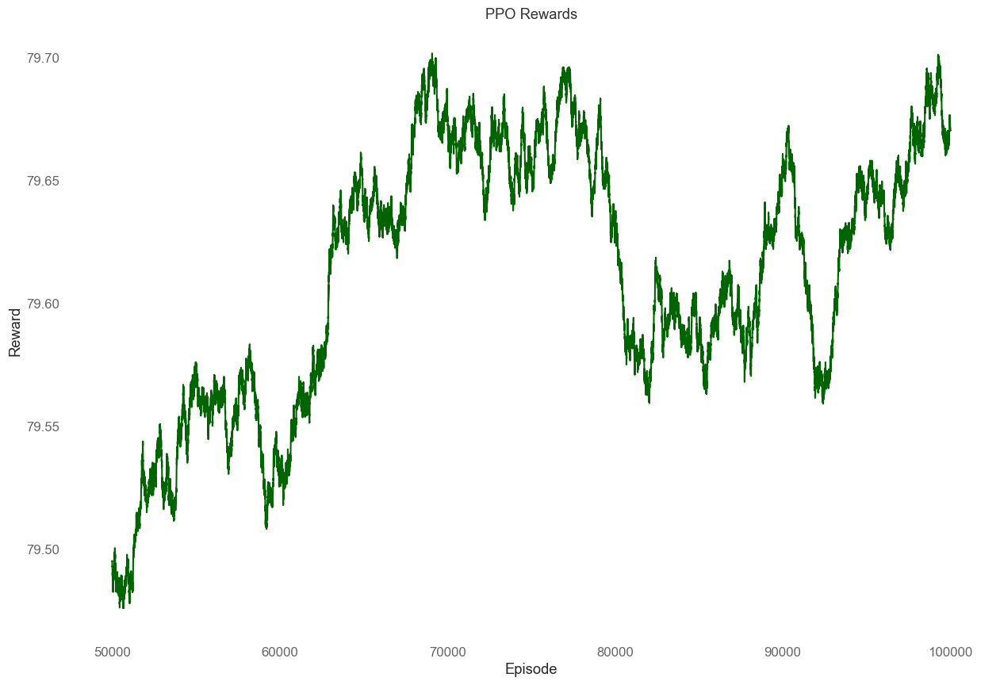

In [ ]:
plt.figure(figsize=(15, 10))
#plt.plot(results['Random actions'], label='Random Actions')
plt.plot(results['PPO_MA'], color='darkgreen')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('PPO Rewards')
plt.grid(False)
plt.show()

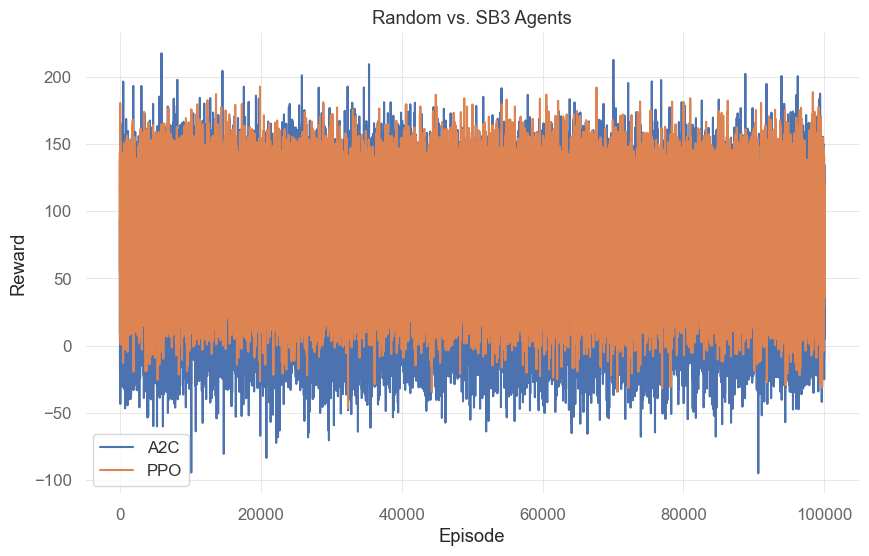

In [ ]:
plt.figure(figsize=(10, 6))
#plt.plot(results['Random actions'], label='Random Actions')
plt.plot(results['A2C'], label='A2C')
plt.plot(results['PPO'], label='PPO')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Random vs. SB3 Agents')
plt.legend()
plt.show()

#### 4.1.1 Average rewards

In [ ]:
results_rewards = pd.DataFrame()
results_dict_rewards = {
    #'Random actions': [item for item in rewards_array_random],
    'A2C': [item for item in avg_episode_rewards_a2c],
    'PPO': [item for item in avg_episode_rewards_ppo]
}
results_rewards = pd.DataFrame(results_dict_rewards)

In [ ]:
window_size = 1000  # You can adjust the window size based on your preference

results_rewards['A2C_MA'] = results_rewards['A2C'].rolling(window=window_size).mean()

results_rewards['PPO_MA'] = results_rewards['PPO'].rolling(window=window_size).mean()


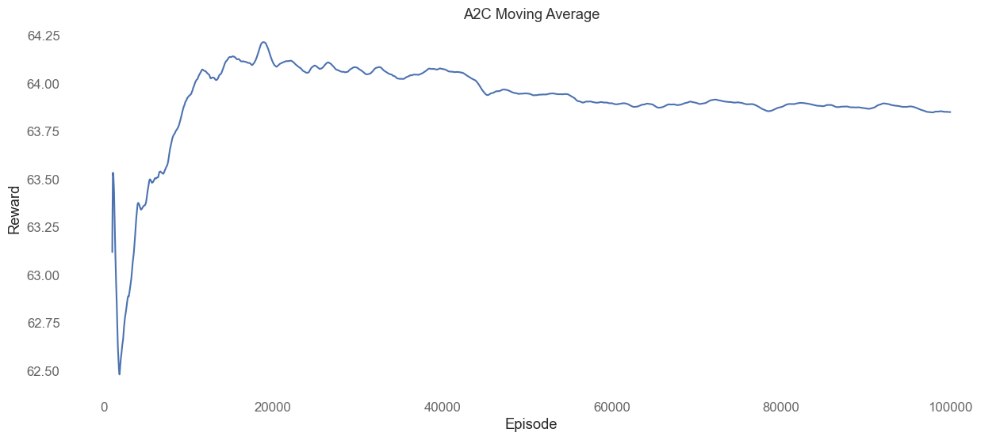

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(results_rewards['A2C_MA'])
plt.xlabel('Episode')
plt.ylabel('Reward')  # Set the y-axis label
plt.title('A2C Moving Average')
plt.grid(False)


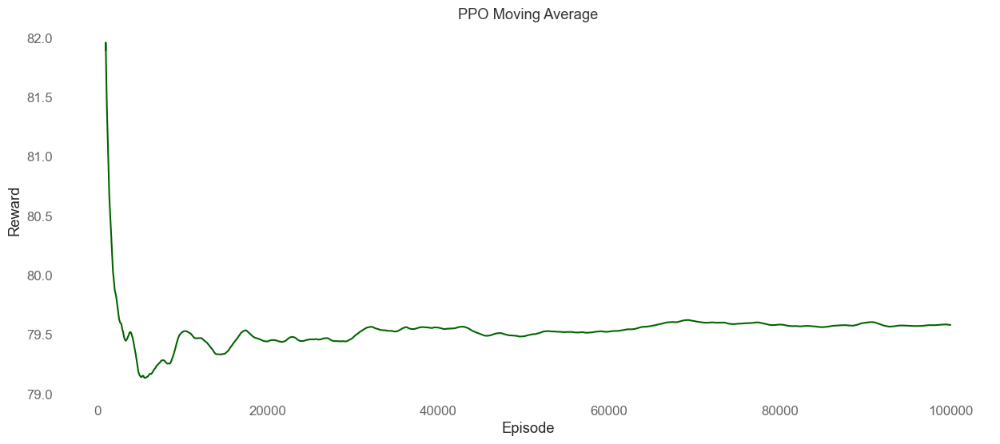

In [ ]:
plt.figure(figsize=(15, 6))
# Subplot for PPO
plt.plot(results_rewards['PPO_MA'], color='darkgreen')
plt.xlabel('Episode')  # Set the x-axis label
plt.ylabel('Reward')
plt.title('PPO Moving Average')
plt.grid(False)

plt.show()

### 4.2 A2C

In [ ]:
def get_env(total_data):
    index_profit = 0
    t_profit = 0
    max_profit = []
    for i,j in enumerate(total_data):
        t_profit = total_data[i][1][1]['total_profit']
        if t_profit > index_profit:
            index_profit = t_profit
            max_profit.append(i)
    final_index = np.max(max_profit)
    print('Episode', final_index)
    return final_index

In [ ]:
a2c_env = get_env(total_data_a2c)

Episode 82599


#### Most profitable episode

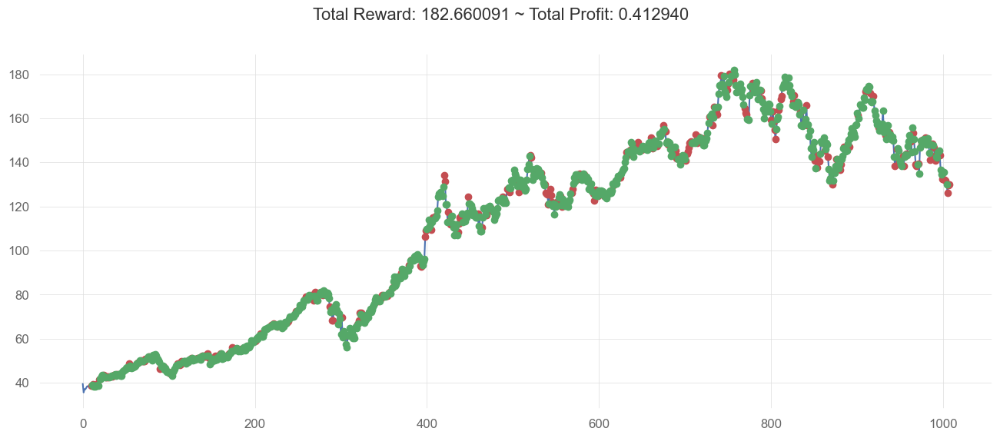

In [ ]:
plt.figure(figsize=(16, 6))
total_data_a2c[a2c_env][1][0].unwrapped.render_all()
plt.show()

#### Evaluation metrics

/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or 

                           Strategy
-------------------------  ----------
Start Period               2019-01-18
End Period                 2022-12-30
Risk-Free Rate             0.0%
Time in Market             20.0%

Cumulative Return          -58.71%
CAGR﹪                     -14.32%

Sharpe                     -0.67
Prob. Sharpe Ratio         9.66%
Smart Sharpe               -0.67
Sortino                    -0.94
Smart Sortino              -0.94
Sortino/√2                 -0.67
Smart Sortino/√2           -0.67
Omega                      0.77

Max Drawdown               -68.42%
Longest DD Days            843
Volatility (ann.)          27.77%
Calmar                     -0.21
Skew                       0.69
Kurtosis                   21.36

Expected Daily %           -0.09%
Expected Monthly %         -1.83%
Expected Yearly %          -19.84%
Kelly Criterion            -11.86%
Risk of Ruin               0.0%
Daily Value-at-Risk        -2.95%
Expected Shortfall (cVaR)  -2.95%

Max Consecut

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-09-09,2022-12-28,2022-12-30,843,-68.422515,-65.608972
2,2019-03-28,2019-08-02,2020-02-03,313,-22.436872,-21.313903
3,2020-02-10,2020-03-06,2020-06-19,131,-22.373780,-20.503568
4,2020-06-29,2020-07-23,2020-07-30,32,-6.940142,-2.771563
5,2019-02-11,2019-03-01,2019-03-20,38,-4.557726,-3.463613


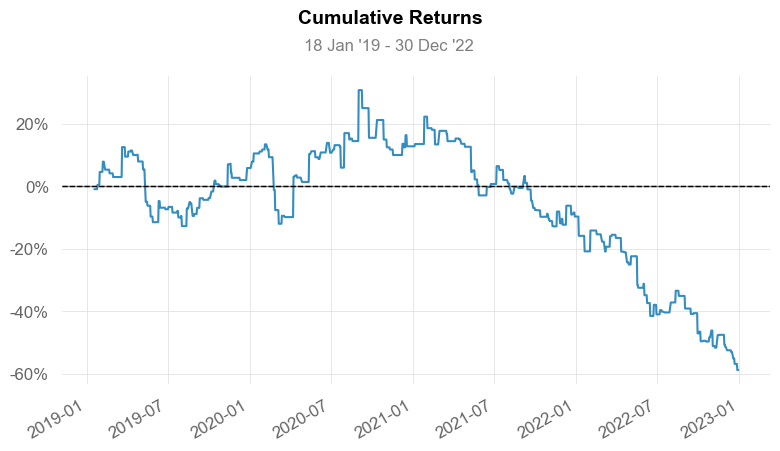

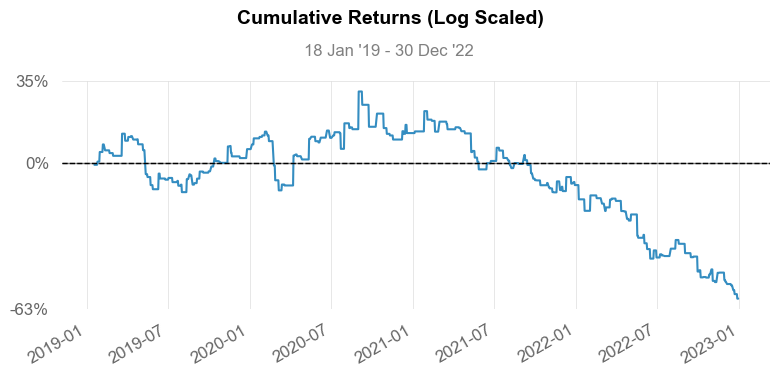

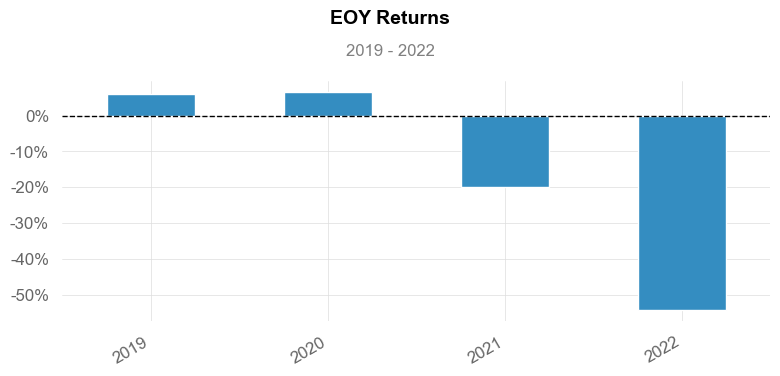

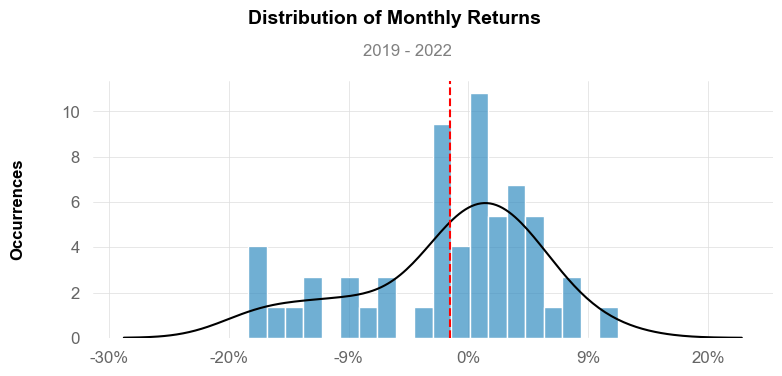

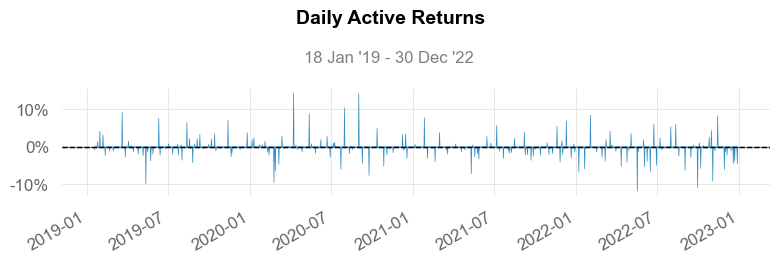

...

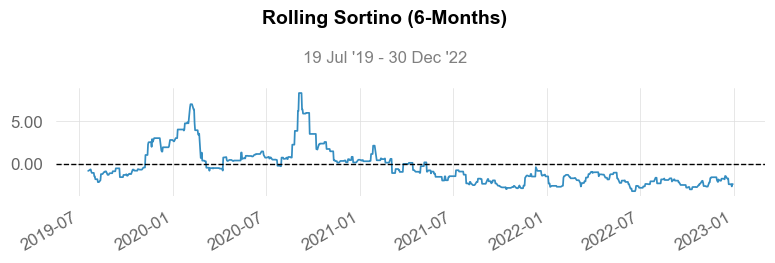

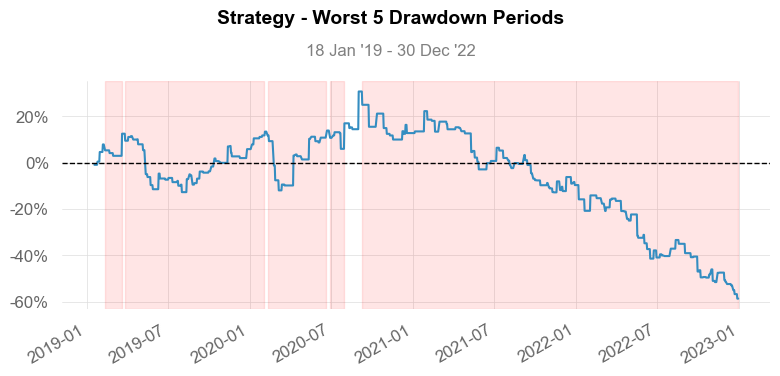

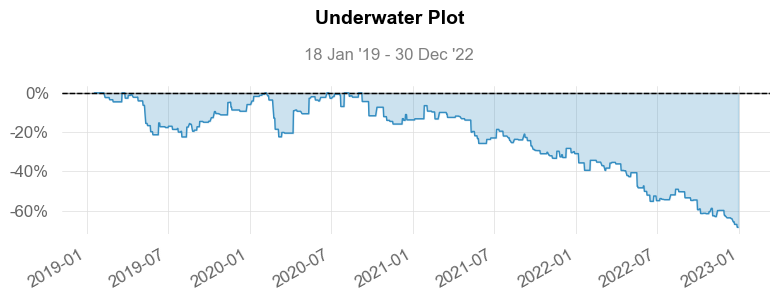

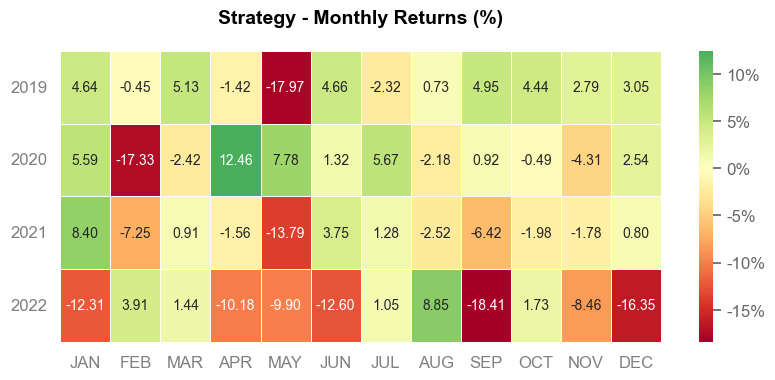

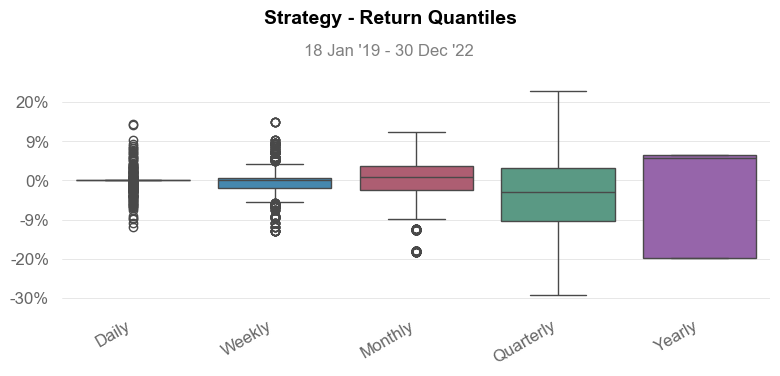

In [ ]:
qs.extend_pandas()

net_worth = pd.Series(total_data_a2c[a2c_env][1][0].unwrapped.history['total_profit'], index=apple.index[start_index+1:end_index])
returns = net_worth.pct_change().iloc[1:]

qs.reports.full(returns)

### 4.3 PPO

In [ ]:
ppo_env = get_env(total_data_ppo)

Episode 69914


#### Most profitable episode

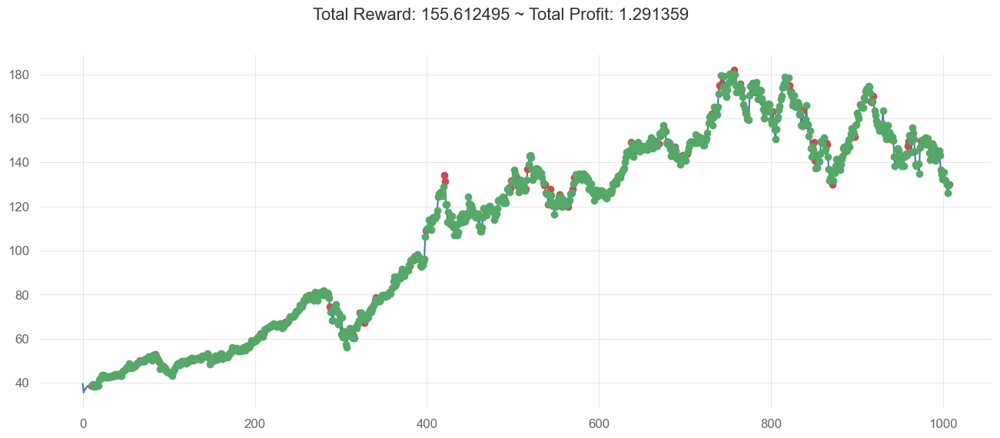

In [ ]:
plt.figure(figsize=(16, 6))
total_data_ppo[ppo_env][1][0].unwrapped.render_all()
plt.show()

#### Evaluation metrics

/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/Users/vp/anaconda3/envs/tasi-env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.prod with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or 

                           Strategy
-------------------------  ----------
Start Period               2019-01-18
End Period                 2022-12-30
Risk-Free Rate             0.0%
Time in Market             11.0%

Cumulative Return          29.14%
CAGR﹪                     4.57%

Sharpe                     0.36
Prob. Sharpe Ratio         77.33%
Smart Sharpe               0.36
Sortino                    0.63
Smart Sortino              0.63
Sortino/√2                 0.45
Smart Sortino/√2           0.45
Omega                      1.23

Max Drawdown               -45.38%
Longest DD Days            719
Volatility (ann.)          28.97%
Calmar                     0.1
Skew                       3.56
Kurtosis                   47.33

Expected Daily %           0.03%
Expected Monthly %         0.53%
Expected Yearly %          6.6%
Kelly Criterion            9.11%
Risk of Ruin               0.0%
Daily Value-at-Risk        -2.96%
Expected Shortfall (cVaR)  -2.96%

Max Consecutive Wins       1


None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2021-01-11,2022-12-30,2022-12-30,719,-45.376505,-35.274820
2,2020-01-28,2020-03-31,2020-04-13,77,-12.246878,-12.116370
3,2019-05-08,2019-08-15,2020-01-16,254,-10.705876,-9.161387
4,2020-09-10,2020-09-10,2020-12-09,91,-7.517104,NaN
5,2020-04-20,2020-04-20,2020-05-05,16,-4.092432,NaN


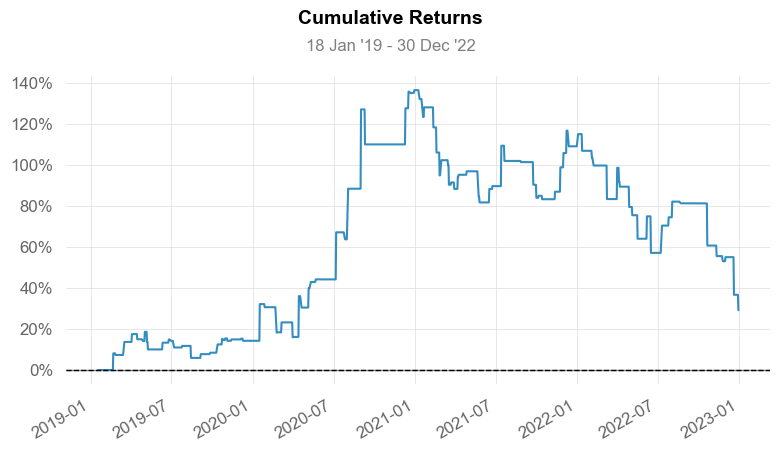

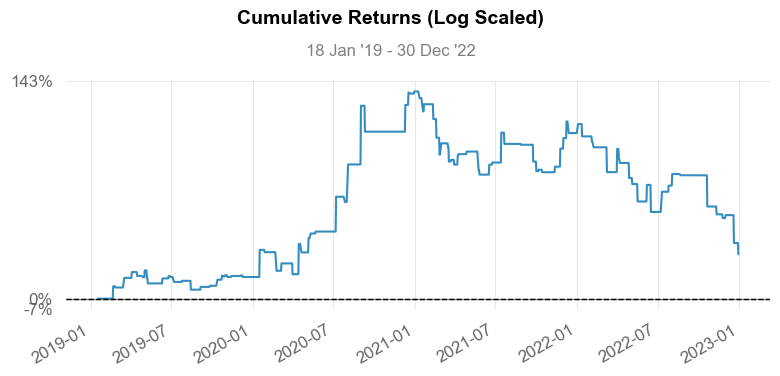

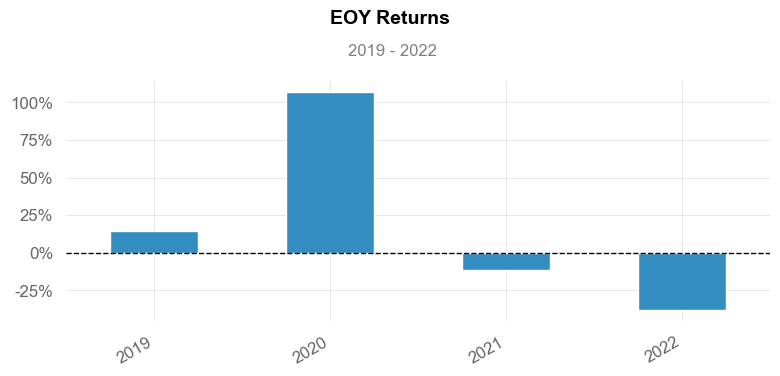

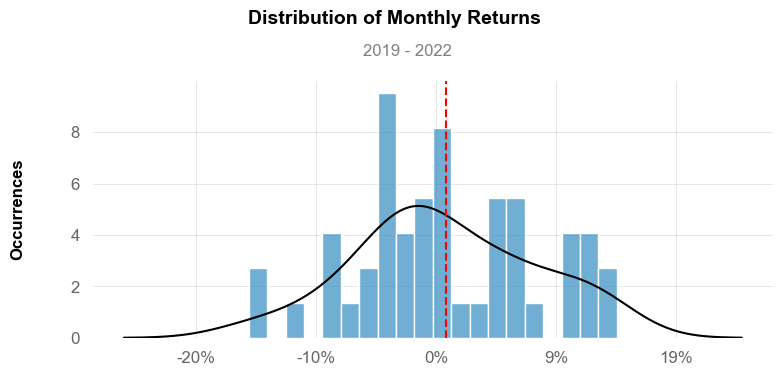

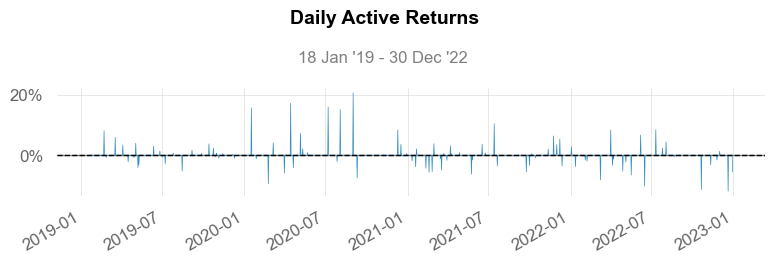

...

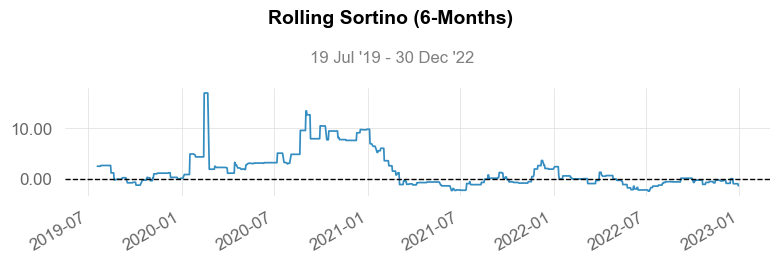

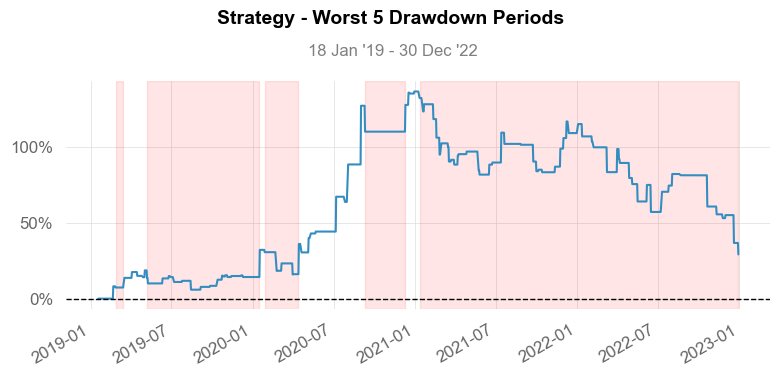

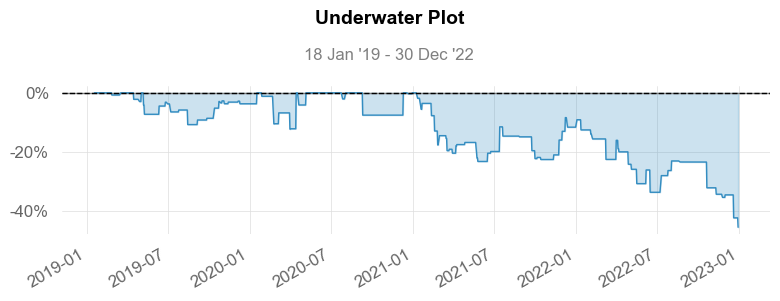

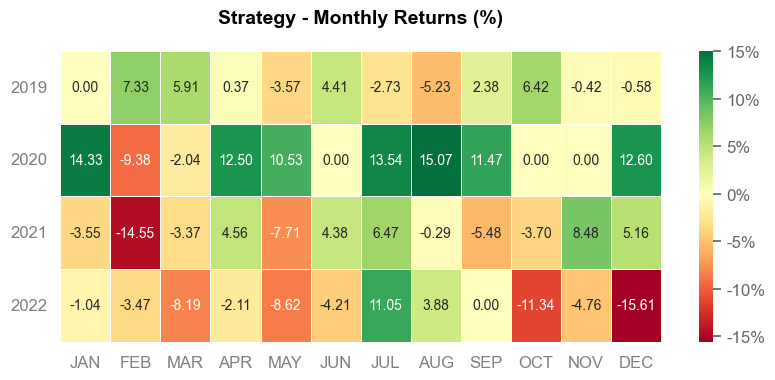

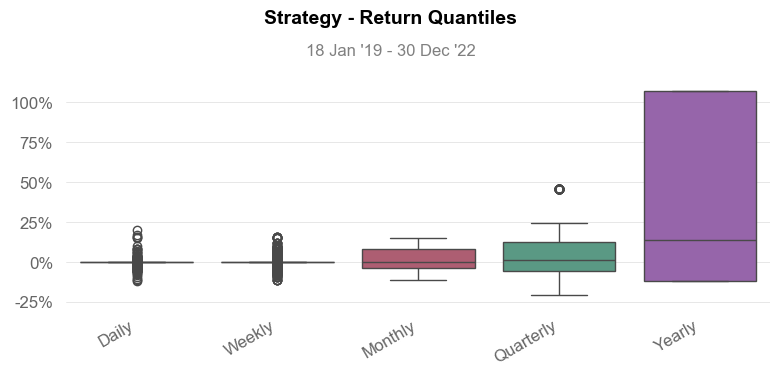

In [ ]:
qs.extend_pandas()

net_worth = pd.Series(total_data_ppo[ppo_env][1][0].unwrapped.history['total_profit'], index=apple.index[start_index+1:end_index])
returns = net_worth.pct_change().iloc[1:]

qs.reports.full(returns)